
0: 384x640 (no detections), 69.5ms
Speed: 2.0ms preprocess, 69.5ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)


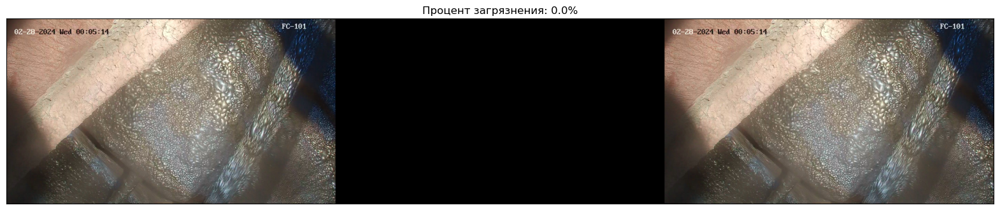


0: 384x640 (no detections), 67.1ms
Speed: 1.0ms preprocess, 67.1ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)


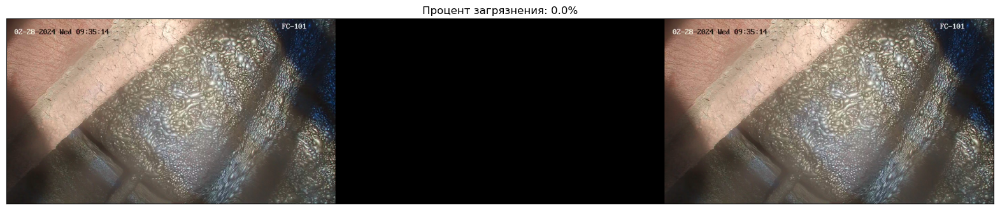


0: 384x640 4 contaminateds, 66.0ms
Speed: 1.0ms preprocess, 66.0ms inference, 4.0ms postprocess per image at shape (1, 3, 384, 640)


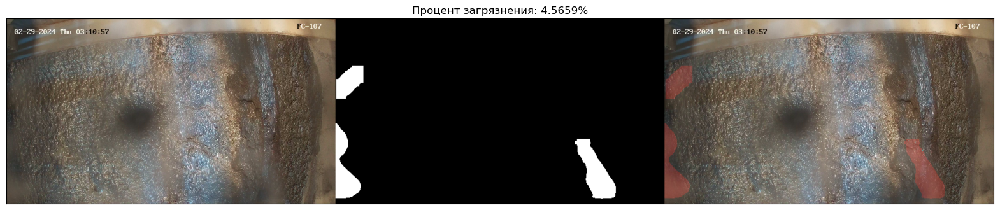


0: 384x640 (no detections), 68.0ms
Speed: 1.0ms preprocess, 68.0ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)


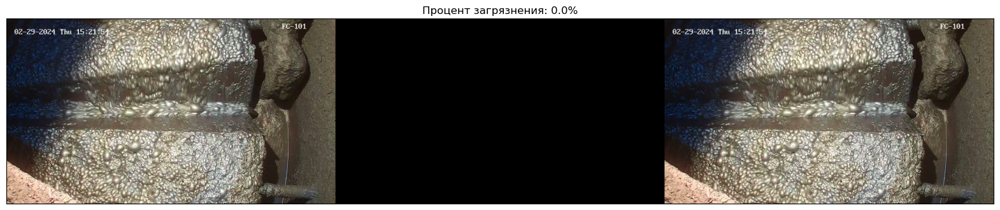


0: 384x640 (no detections), 67.0ms
Speed: 2.0ms preprocess, 67.0ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)


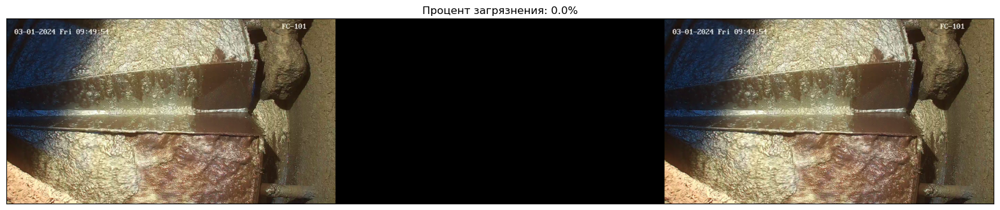


0: 384x640 (no detections), 66.0ms
Speed: 1.0ms preprocess, 66.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


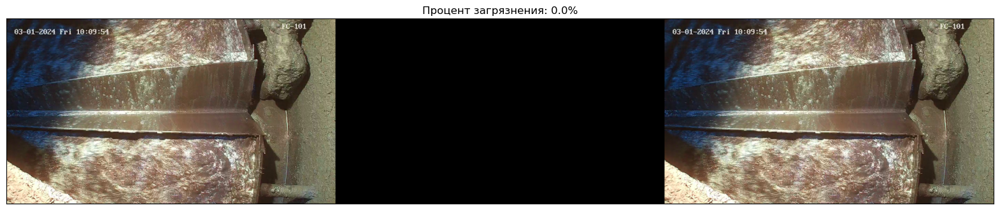


0: 384x640 (no detections), 78.0ms
Speed: 2.0ms preprocess, 78.0ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)


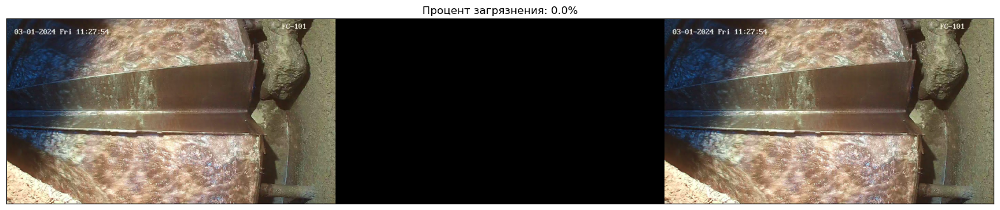


0: 384x640 (no detections), 73.0ms
Speed: 1.0ms preprocess, 73.0ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)


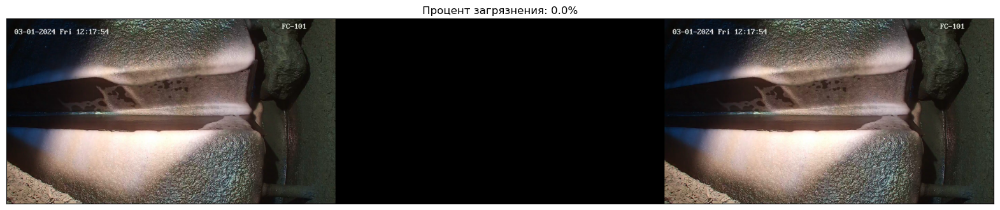


0: 384x640 19 contaminateds, 68.0ms
Speed: 1.0ms preprocess, 68.0ms inference, 17.0ms postprocess per image at shape (1, 3, 384, 640)


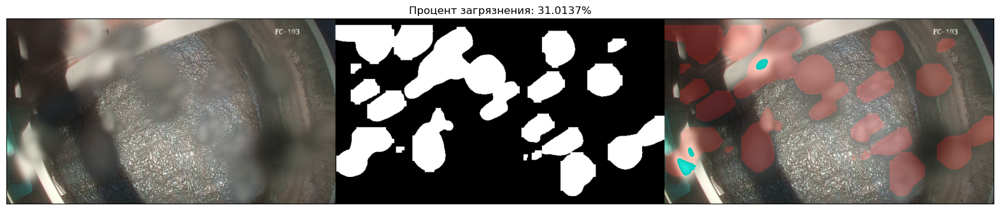


0: 384x640 27 contaminateds, 69.0ms
Speed: 1.0ms preprocess, 69.0ms inference, 27.0ms postprocess per image at shape (1, 3, 384, 640)


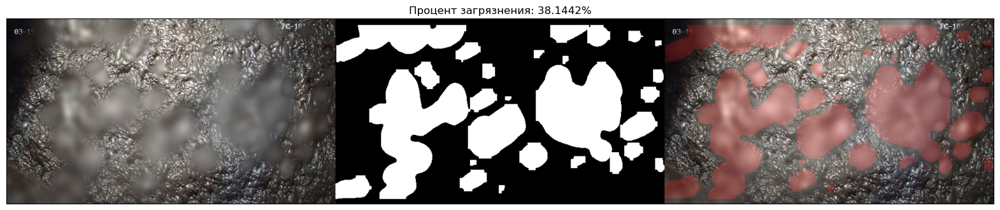


0: 384x640 38 contaminateds, 68.0ms
Speed: 2.0ms preprocess, 68.0ms inference, 42.0ms postprocess per image at shape (1, 3, 384, 640)


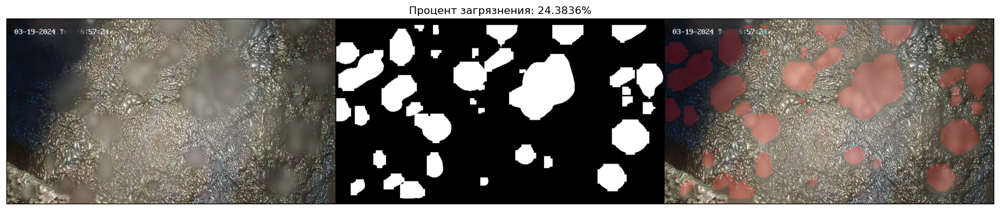


0: 384x640 16 contaminateds, 82.2ms
Speed: 1.0ms preprocess, 82.2ms inference, 15.0ms postprocess per image at shape (1, 3, 384, 640)


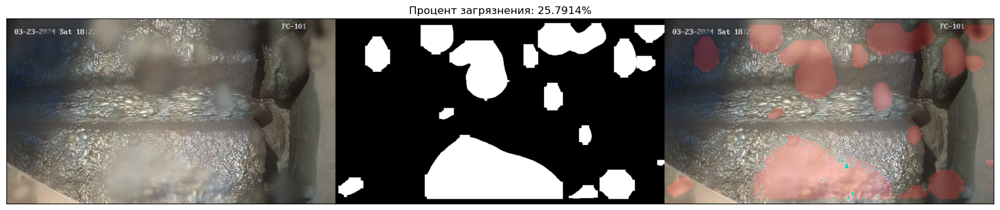

In [79]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt
import os
import numpy as np

def infer_image(model, image_path):
    # Загрузка изображения
    image = cv2.imread(image_path)[:,:,::-1]
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    # Инференс
    return image, model(image)

# Загрузка модели
model_path = './best.pt'
model = YOLO(model_path)
model.to('cpu')

def create_mask(image_path, results):
    # Загружаем изображение и переводим в градации серого
    image = cv2.imread(image_path)
    height, width = image.shape[:2]

    # Создаем пустую маску с черным фоном
    mask = np.zeros((height, width), dtype=np.uint8)

    # Проходим по результатам и создаем маску
    for result in results:
        masks = result.masks  # Получаем маски из результатов
        if masks is not None:
            for mask_array in masks.data:  # Получаем маски как массивы
                mask_i = mask_array.numpy()  # Преобразуем маску в numpy массив

                # Изменяем размер маски под размер оригинального изображения
                mask_i_resized = cv2.resize(mask_i, (width, height), interpolation=cv2.INTER_LINEAR)

                # Накладываем маску на пустую маску (255 для белого)
                mask[mask_i_resized > 0] = 255

    return mask

# Функция для визуализации
def see_plot(pict, color='gray', size=(5,5), title=''):
    plt.figure(figsize=size)
    plt.imshow(pict, cmap=color)
    plt.title(title)
    plt.xticks([],[])
    plt.yticks([],[])
    plt.show()

if __name__ == '__main__':
    # Путь к тестовому датасету
    dataset_path = './test_data'
    # Перебираем все изображения в папке
    for image_name in os.listdir(dataset_path):
        if image_name.lower().endswith((".png",".jpg")):
            image_path = os.path.join(dataset_path, image_name) # Путь к изображению
            # Загружаем изображение и получаем вывод из модели
            image, results = infer_image(model, image_path)
            # Получаем маску из результатов модели
            mask = create_mask(os.path.join(dataset_path, image_name), results)
            # Преобразовываем маску в rgb картинку
            mask = cv2.merge((mask,mask,mask))
            # Считаем процент заргярнения
            dirt_percent = round(np.sum(mask>0) / np.prod(image.shape) * 100,4)
            # Высчитываем картинку наложения маски на оригинальную картинку
            mrg = image.copy()
            mrg[:,:,0] = mrg[:,:,0]+mask[:,:,0]//5
            # Выводим получившееся
            see_plot(np.concatenate([image,mask,mrg],axis=1), size=(20,20),title = f'Процент загрязнения: {dirt_percent}%')

25.791377314814817